In [1]:
import os, copy
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds

import matplotlib.pyplot as plt
from PIL import ImageDraw
from PIL import Image as Img
from IPython.display import Image
import cv2


ModuleNotFoundError: No module named 'google.colab'

NameError: name 'model' is not defined

## 데이터 준비
자율주행을 위한 데이터셋인 KITTI 데이터셋을 사용합니다.

In [ ]:
DATA_PATH = '/content/drive/MyDrive/Colab Notebooks/KITTI'

(ds_train, ds_test), ds_info = tfds.load(
    'kitti',
    data_dir=DATA_PATH,
    split=['train', 'test'],
    shuffle_files=True,
    with_info=True,
)

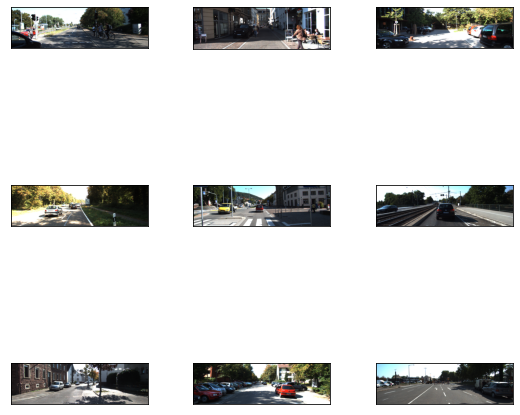

In [ ]:
_ = tfds.show_examples(ds_train, ds_info)

In [ ]:
ds_info

tfds.core.DatasetInfo(
    name='kitti',
    version=3.2.0,
    description='Kitti contains a suite of vision tasks built using an autonomous driving
platform. The full benchmark contains many tasks such as stereo, optical flow,
visual odometry, etc. This dataset contains the object detection dataset,
including the monocular images and bounding boxes. The dataset contains 7481
training images annotated with 3D bounding boxes. A full description of the
annotations can be found in the readme of the object development kit readme on
the Kitti homepage.',
    homepage='http://www.cvlibs.net/datasets/kitti/',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/file_name': Text(shape=(), dtype=tf.string),
        'objects': Sequence({
            'alpha': tf.float32,
            'bbox': BBoxFeature(shape=(4,), dtype=tf.float32),
            'dimensions': Tensor(shape=(3,), dtype=tf.float32),
            'location': Tensor(shape=(3,), dtype

------Example------
['image', 'image/file_name', 'objects']
------objects------
{'alpha': <tf.Tensor: shape=(3,), dtype=float32, numpy=array([1.86, 1.78, 1.66], dtype=float32)>, 'bbox': <tf.Tensor: shape=(3, 4), dtype=float32, numpy=
array([[0.15      , 0.2015781 , 0.47650668, 0.35160226],
       [0.30914667, 0.3097182 , 0.5501867 , 0.39968598],
       [0.43210667, 0.4125282 , 0.52104   , 0.44924316]], dtype=float32)>, 'dimensions': <tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[1.39, 1.48, 3.76],
       [1.81, 1.66, 4.05],
       [1.46, 1.75, 4.23]], dtype=float32)>, 'location': <tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[-3.74,  1.78, 10.66],
       [-3.8 ,  1.76, 16.65],
       [-3.51,  1.79, 34.16]], dtype=float32)>, 'occluded': <tf.Tensor: shape=(3,), dtype=int64, numpy=array([0, 1, 0])>, 'rotation_y': <tf.Tensor: shape=(3,), dtype=float32, numpy=array([1.53, 1.56, 1.56], dtype=float32)>, 'truncated': <tf.Tensor: shape=(3,), dtype=float32, numpy=array([0., 0.,

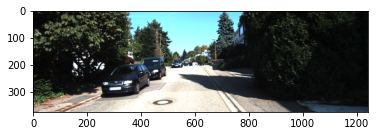

In [ ]:
sample = ds_train.take(1)

for example in sample:
    print('------Example------')
    print(list(example.keys()))
    image = example["image"]
    filename = example["image/file_name"].numpy().decode('utf-8')
    objects = example["objects"]

print('------objects------')
print(objects)

img = Img.fromarray(image.numpy())
plt.imshow(img)
plt.show()

In [ ]:
# 이미지 위에 바운딩 박스를 그려 표시해줍니다.
def visualize_bbox(input_image, object_bbox):
    input_image = copy.deepcopy(input_image)
    draw = ImageDraw.Draw(input_image)
    
    # 바운딩 박스 좌표(x_min, x_max, y_min, y_max) 구하기
    width, height = img.size
    x_min = object_bbox[:,1] * width
    x_max = object_bbox[:,3] * width
    y_min = height - object_bbox[:,0] * height
    y_max = height - object_bbox[:,2] * height
    
    # 바운딩 박스 그리기
    rects = np.stack([x_min, y_min, x_max, y_max], axis=1)
    for _rect in rects:
        draw.rectangle(_rect, outline=(255,0,0), width=2)

    return input_image

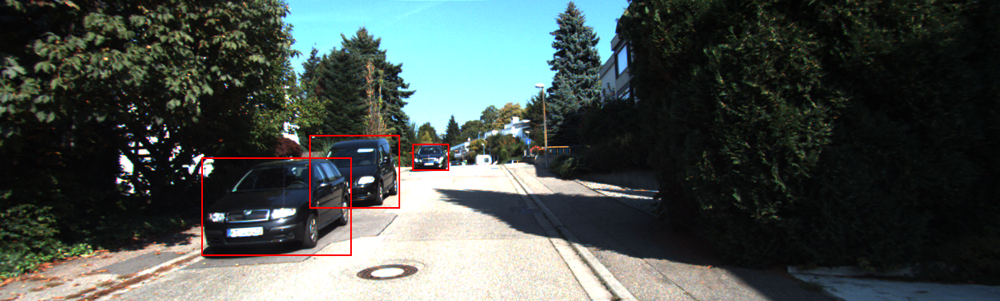

In [ ]:
visualize_bbox(img, objects['bbox'].numpy())

## 데이터 전처리

### 데이터 파이프 라인

먼저 주어진 KITTI 데이터를 학습에 맞는 형태로 바꾸어 주어야 합니다. 이때 사용할 데이터 파이프라인을 구축합니다.

데이터 파이프라인은 총 4단계로 이루어집니다.

1. x와 y좌표 위치 교체
2. 무작위로 수평 뒤집기(Flip)
3. 이미지 크기 조정 및 패딩 추가
4. 좌표계를 [x_min, y_min, x_max, y_max]에서 [x_min, y_min, width, height]으로 수정

독립적인 함수를 각각 작성합니다.



In [24]:
def swap_xy(boxes):
    return tf.stack([boxes[:, 1], boxes[:, 0], boxes[:, 3], boxes[:, 2]], axis=-1)

In [25]:
def random_flip_horizontal(image, boxes):
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        boxes = tf.stack(
           [1 - boxes[:, 2], boxes[:, 1], 1 - boxes[:, 0], boxes[:, 3]], axis=-1
        )
        
    return image, boxes

In [45]:
def resize_and_pad_image(image, training=False):

    min_side = 800.0
    max_side = 1333.0
    min_side_range = [640, 1024]
    stride = 128.0
    
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    if training:
        min_side = tf.random.uniform((), min_side_range[0], min_side_range[1], dtype=tf.float32)
    ratio = min_side / tf.reduce_min(image_shape)
    if ratio * tf.reduce_max(image_shape) > max_side:
        ratio = max_side / tf.reduce_max(image_shape)
    image_shape = ratio * image_shape
    image = tf.image.resize(image, tf.cast(image_shape, dtype=tf.int32))
    padded_image_shape = tf.cast(
        tf.math.ceil(image_shape / stride) * stride, dtype=tf.int32
    )
    image = tf.image.pad_to_bounding_box(
        image, 0, 0, padded_image_shape[0], padded_image_shape[1]
    )
    return image, image_shape, ratio


In [27]:
def convert_to_xywh(boxes):
    return tf.concat(
        [(boxes[..., :2] + boxes[..., 2:]) / 2.0, boxes[..., 2:] - boxes[..., :2]],
        axis=-1,
    )

이제 준비된 함수들을 연결해 줍니다.

In [28]:
def preprocess_data(sample):
    image = sample["image"]
    bbox = swap_xy(sample["objects"]["bbox"])
    class_id = tf.cast(sample["objects"]["type"], dtype=tf.int32)

    image, bbox = random_flip_horizontal(image, bbox)
    image, image_shape, _ = resize_and_pad_image(image)

    bbox = tf.stack(
        [
            bbox[:, 0] * image_shape[1],
            bbox[:, 1] * image_shape[0],
            bbox[:, 2] * image_shape[1],
            bbox[:, 3] * image_shape[0],
        ],
        axis=-1,
    )
    bbox = convert_to_xywh(bbox)
    return image, bbox, class_id

### Encoding

사용하려는 모델 RetinaNet에서는 One stage detector로써 anchorbox를 사용합니다.<br>
[RetinaNet의 논문](https://lms.aiffel.io/steps2/3168)과 같은 형태로 Anchor Box를 생성합니다.

In [3]:
class AnchorBox:
    def __init__(self):
        self.aspect_ratios = [0.5, 1.0, 2.0]
        self.scales = [2 ** x for x in [0, 1 / 3, 2 / 3]]

        self._num_anchors = len(self.aspect_ratios) * len(self.scales)
        self._strides = [2 ** i for i in range(3, 8)]
        self._areas = [x ** 2 for x in [32.0, 64.0, 128.0, 256.0, 512.0]]
        self._anchor_dims = self._compute_dims()

    def _compute_dims(self):
        anchor_dims_all = []
        for area in self._areas:
            anchor_dims = []
            for ratio in self.aspect_ratios:
                anchor_height = tf.math.sqrt(area / ratio)
                anchor_width = area / anchor_height
                dims = tf.reshape(
                    tf.stack([anchor_width, anchor_height], axis=-1), [1, 1, 2]
                )
                for scale in self.scales:
                    anchor_dims.append(scale * dims)
            anchor_dims_all.append(tf.stack(anchor_dims, axis=-2))
        return anchor_dims_all

    def _get_anchors(self, feature_height, feature_width, level):
        rx = tf.range(feature_width, dtype=tf.float32) + 0.5
        ry = tf.range(feature_height, dtype=tf.float32) + 0.5
        centers = tf.stack(tf.meshgrid(rx, ry), axis=-1) * self._strides[level - 3]
        centers = tf.expand_dims(centers, axis=-2)
        centers = tf.tile(centers, [1, 1, self._num_anchors, 1])
        dims = tf.tile(
            self._anchor_dims[level - 3], [feature_height, feature_width, 1, 1]
        )
        anchors = tf.concat([centers, dims], axis=-1)
        return tf.reshape(
            anchors, [feature_height * feature_width * self._num_anchors, 4]
        )

    def get_anchors(self, image_height, image_width):
        anchors = [
            self._get_anchors(
                tf.math.ceil(image_height / 2 ** i),
                tf.math.ceil(image_width / 2 ** i),
                i,
            )
            for i in range(3, 8)
        ]
        return tf.concat(anchors, axis=0)

입력할 데이터를 Anchor Box에 맞게 변형해줘야 합니다. <br>
IoU가 높은지 낮은지에 따라 Anchor Box가 정답인지 오답인지 체크할 수 있으므로  IoU를 계산할 수 있는 함수를 만듭니다.

In [4]:
def convert_to_corners(boxes):
    return tf.concat(
        [boxes[..., :2] - boxes[..., 2:] / 2.0, boxes[..., :2] + boxes[..., 2:] / 2.0],
        axis=-1,
    )

def compute_iou(boxes1, boxes2):
    boxes1_corners = convert_to_corners(boxes1)
    boxes2_corners = convert_to_corners(boxes2)
    lu = tf.maximum(boxes1_corners[:, None, :2], boxes2_corners[:, :2])
    rd = tf.minimum(boxes1_corners[:, None, 2:], boxes2_corners[:, 2:])
    intersection = tf.maximum(0.0, rd - lu)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    boxes1_area = boxes1[:, 2] * boxes1[:, 3]
    boxes2_area = boxes2[:, 2] * boxes2[:, 3]
    union_area = tf.maximum(
        boxes1_area[:, None] + boxes2_area - intersection_area, 1e-8
    )
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)

`AnchorBox`와 `compute_iou`를 사용하여 실제 라벨을 Anchor Box에 맞춰주는 `LabelEncoder` 클래스를 만들어 줍니다.
<details markdown="1">
<summary>접기/펼치기</summary>

위에서 작성한 `compute_iou` 함수를 이용해서 IoU를 구하고 그 IoU를 기준으로 물체에 해당하는 Anchor Box와 배경이 되는 Anchor Box를 지정해 줍니다. <br>
그리고 그 Anchor Box와 실제 Bounding Box의 미세한 차이를 계산합니다. <br>
상하좌우의 차이, 가로세로 크기의 차이를 기록해 두는데 가로세로 크기는 로그를 사용해서 기록해 둡니다.

</details>


In [5]:
class LabelEncoder:

    def __init__(self):
        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            [0.1, 0.1, 0.2, 0.2], dtype=tf.float32
        )

    def _match_anchor_boxes(
        self, anchor_boxes, gt_boxes, match_iou=0.5, ignore_iou=0.4
    ):
        iou_matrix = compute_iou(anchor_boxes, gt_boxes)
        max_iou = tf.reduce_max(iou_matrix, axis=1)
        matched_gt_idx = tf.argmax(iou_matrix, axis=1)
        positive_mask = tf.greater_equal(max_iou, match_iou)
        negative_mask = tf.less(max_iou, ignore_iou)
        ignore_mask = tf.logical_not(tf.logical_or(positive_mask, negative_mask))
        return (
            matched_gt_idx,
            tf.cast(positive_mask, dtype=tf.float32),
            tf.cast(ignore_mask, dtype=tf.float32),
        )

    def _compute_box_target(self, anchor_boxes, matched_gt_boxes):
        box_target = tf.concat(
            [
                (matched_gt_boxes[:, :2] - anchor_boxes[:, :2]) / anchor_boxes[:, 2:],
                tf.math.log(matched_gt_boxes[:, 2:] / anchor_boxes[:, 2:]),
            ],
            axis=-1,
        )
        box_target = box_target / self._box_variance
        return box_target

    def _encode_sample(self, image_shape, gt_boxes, cls_ids):
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        cls_ids = tf.cast(cls_ids, dtype=tf.float32)
        matched_gt_idx, positive_mask, ignore_mask = self._match_anchor_boxes(
            anchor_boxes, gt_boxes
        )
        matched_gt_boxes = tf.gather(gt_boxes, matched_gt_idx)
        box_target = self._compute_box_target(anchor_boxes, matched_gt_boxes)
        matched_gt_cls_ids = tf.gather(cls_ids, matched_gt_idx)
        cls_target = tf.where(
            tf.not_equal(positive_mask, 1.0), -1.0, matched_gt_cls_ids
        )
        cls_target = tf.where(tf.equal(ignore_mask, 1.0), -2.0, cls_target)
        cls_target = tf.expand_dims(cls_target, axis=-1)
        label = tf.concat([box_target, cls_target], axis=-1)
        return label

    def encode_batch(self, batch_images, gt_boxes, cls_ids):
        images_shape = tf.shape(batch_images)
        batch_size = images_shape[0]

        labels = tf.TensorArray(dtype=tf.float32, size=batch_size, dynamic_size=True)
        for i in range(batch_size):
            label = self._encode_sample(images_shape, gt_boxes[i], cls_ids[i])
            labels = labels.write(i, label)
        batch_images = tf.keras.applications.resnet.preprocess_input(batch_images)
        return batch_images, labels.stack()

## 모델 구성


###Feature Pyramid

RetinaNet에서는 FPN(Feature Pyramid Network)를 사용합니다. 완전히 동일한 것은 아니고 약간 수정해서 사용했습니다. 자세한 설명은 논문에 나와있습니다.

In [6]:
class FeaturePyramid(tf.keras.layers.Layer):

    def __init__(self, backbone):
        super(FeaturePyramid, self).__init__(name="FeaturePyramid")
        self.backbone = backbone
        self.conv_c3_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c4_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c5_1x1 = tf.keras.layers.Conv2D(256, 1, 1, "same")
        self.conv_c3_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c4_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c5_3x3 = tf.keras.layers.Conv2D(256, 3, 1, "same")
        self.conv_c6_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.conv_c7_3x3 = tf.keras.layers.Conv2D(256, 3, 2, "same")
        self.upsample_2x = tf.keras.layers.UpSampling2D(2)

    def call(self, images, training=False):
        c3_output, c4_output, c5_output = self.backbone(images, training=training)
        p3_output = self.conv_c3_1x1(c3_output)
        p4_output = self.conv_c4_1x1(c4_output)
        p5_output = self.conv_c5_1x1(c5_output)
        p4_output = p4_output + self.upsample_2x(p5_output)
        p3_output = p3_output + self.upsample_2x(p4_output)
        p3_output = self.conv_c3_3x3(p3_output)
        p4_output = self.conv_c4_3x3(p4_output)
        p5_output = self.conv_c5_3x3(p5_output)
        p6_output = self.conv_c6_3x3(c5_output)
        p7_output = self.conv_c7_3x3(tf.nn.relu(p6_output))
        return p3_output, p4_output, p5_output, p6_output, p7_output

### head
Object Detection의 라벨은 class와 box로 이루어지므로 각각을 추론하는 head 부분이 필요합니다.<br>
Backbone에 해당하는 네트워크와 FPN을 통해 pyramid layer가 추출되고 나면 그 feature들을 바탕으로 class를 예상하고, box도 예상합니다
<br>
class와 box가 모두 맞을 수도, class와 box 중 하나만 맞을 수도, 둘 다 틀릴 수도 있으므로 head와 box를 예측하는 head를 별도로 만들어줘야 합니다.
<br>
각각의 head를 `build_head`를 통해 만들어 줍니다.

In [7]:
def build_head(output_filters, bias_init):
    head = tf.keras.Sequential([tf.keras.Input(shape=[None, None, 256])])
    kernel_init = tf.initializers.RandomNormal(0.0, 0.01)
    for _ in range(4):
        head.add(
            tf.keras.layers.Conv2D(256, 3, padding="same", kernel_initializer=kernel_init)
        )
        head.add(tf.keras.layers.ReLU())
    head.add(
        tf.keras.layers.Conv2D(
            output_filters,
            3,
            1,
            padding="same",
            kernel_initializer=kernel_init,
            bias_initializer=bias_init,
        )
    )
    return head

RetinaNet의 backbone은 ResNet50입니다. FPN에 이용할 수 있도록 중간 레이어도 output으로 연결해 줍니다.

In [8]:
def get_backbone():
    backbone = tf.keras.applications.ResNet50(
        include_top=False, input_shape=[None, None, 3]
    )
    c3_output, c4_output, c5_output = [
        backbone.get_layer(layer_name).output
        for layer_name in ["conv3_block4_out", "conv4_block6_out", "conv5_block3_out"]
    ]
    return tf.keras.Model(
        inputs=[backbone.inputs], outputs=[c3_output, c4_output, c5_output]
    )

마지막으로 "Backbone + FPN + classification용 head + box용 head" 형태의 RetinaNet을 완성합니다.

In [9]:
class RetinaNet(tf.keras.Model):

    def __init__(self, num_classes, backbone):
        super(RetinaNet, self).__init__(name="RetinaNet")
        self.fpn = FeaturePyramid(backbone)
        self.num_classes = num_classes

        prior_probability = tf.constant_initializer(-np.log((1 - 0.01) / 0.01))
        self.cls_head = build_head(9 * num_classes, prior_probability)
        self.box_head = build_head(9 * 4, "zeros")

    def call(self, image, training=False):
        features = self.fpn(image, training=training)
        N = tf.shape(image)[0]
        cls_outputs = []
        box_outputs = []
        for feature in features:
            box_outputs.append(tf.reshape(self.box_head(feature), [N, -1, 4]))
            cls_outputs.append(
                tf.reshape(self.cls_head(feature), [N, -1, self.num_classes])
            )
        cls_outputs = tf.concat(cls_outputs, axis=1)
        box_outputs = tf.concat(box_outputs, axis=1)
        return tf.concat([box_outputs, cls_outputs], axis=-1)

### loss
RetinaNet에서는 논문에서 설명하는 손실함수인 Focal Loss를 사용합니다. <br>
Box Regression에는 사용하지 않고 Classification Loss를 계산하는데만 사용됩니다. Box Regression에는 Smooth L1 Loss를 사용합니다.

<details markdown="1">
<summary>주의</summary>

Smooth L1 Loss을 사용하는 Box Regression에는 delta를 기준으로 계산이 달라지고, Focal Loss를 사용하는 Classification에서는 alpha와 gamma를 사용해서 물체일 때와 배경일 때의 식이 달라집니다.

</details>


In [10]:
class RetinaNetBoxLoss(tf.losses.Loss):

    def __init__(self, delta):
        super(RetinaNetBoxLoss, self).__init__(
            reduction="none", name="RetinaNetBoxLoss"
        )
        self._delta = delta

    def call(self, y_true, y_pred):
        difference = y_true - y_pred
        absolute_difference = tf.abs(difference)
        squared_difference = difference ** 2
        loss = tf.where(
            tf.less(absolute_difference, self._delta),
            0.5 * squared_difference,
            absolute_difference - 0.5,
        )
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetClassificationLoss(tf.losses.Loss):

    def __init__(self, alpha, gamma):
        super(RetinaNetClassificationLoss, self).__init__(
            reduction="none", name="RetinaNetClassificationLoss"
        )
        self._alpha = alpha
        self._gamma = gamma

    def call(self, y_true, y_pred):
        cross_entropy = tf.nn.sigmoid_cross_entropy_with_logits(
            labels=y_true, logits=y_pred
        )
        probs = tf.nn.sigmoid(y_pred)
        alpha = tf.where(tf.equal(y_true, 1.0), self._alpha, (1.0 - self._alpha))
        pt = tf.where(tf.equal(y_true, 1.0), probs, 1 - probs)
        loss = alpha * tf.pow(1.0 - pt, self._gamma) * cross_entropy
        return tf.reduce_sum(loss, axis=-1)


class RetinaNetLoss(tf.losses.Loss):

    def __init__(self, num_classes=8, alpha=0.25, gamma=2.0, delta=1.0):
        super(RetinaNetLoss, self).__init__(reduction="auto", name="RetinaNetLoss")
        self._clf_loss = RetinaNetClassificationLoss(alpha, gamma)
        self._box_loss = RetinaNetBoxLoss(delta)
        self._num_classes = num_classes

    def call(self, y_true, y_pred):
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        box_labels = y_true[:, :, :4]
        box_predictions = y_pred[:, :, :4]
        cls_labels = tf.one_hot(
            tf.cast(y_true[:, :, 4], dtype=tf.int32),
            depth=self._num_classes,
            dtype=tf.float32,
        )
        cls_predictions = y_pred[:, :, 4:]
        positive_mask = tf.cast(tf.greater(y_true[:, :, 4], -1.0), dtype=tf.float32)
        ignore_mask = tf.cast(tf.equal(y_true[:, :, 4], -2.0), dtype=tf.float32)
        clf_loss = self._clf_loss(cls_labels, cls_predictions)
        box_loss = self._box_loss(box_labels, box_predictions)
        clf_loss = tf.where(tf.equal(ignore_mask, 1.0), 0.0, clf_loss)
        box_loss = tf.where(tf.equal(positive_mask, 1.0), box_loss, 0.0)
        normalizer = tf.reduce_sum(positive_mask, axis=-1)
        clf_loss = tf.math.divide_no_nan(tf.reduce_sum(clf_loss, axis=-1), normalizer)
        box_loss = tf.math.divide_no_nan(tf.reduce_sum(box_loss, axis=-1), normalizer)
        loss = clf_loss + box_loss
        return loss

## 모델 학습

앞에서 만들어 놓은 클래스와 함수를 이용해 모델을 생성해줍니다.

In [11]:
num_classes = 8
batch_size = 2

resnet50_backbone = get_backbone()
loss_fn = RetinaNetLoss(num_classes)
model = RetinaNet(num_classes, resnet50_backbone)

94781440/94765736 [==============================] - 1s 0us/step


In [12]:
learning_rates = [2.5e-06, 0.000625, 0.00125, 0.0025, 0.00025, 2.5e-05]
learning_rate_boundaries = [125, 250, 500, 240000, 360000]
learning_rate_fn = tf.optimizers.schedules.PiecewiseConstantDecay(
    boundaries=learning_rate_boundaries, values=learning_rates
)
#Optimizer는 논문과 동일하게 SGD를 사용합니다.
optimizer = tf.optimizers.SGD(learning_rate=learning_rate_fn, momentum=0.9)
model.compile(loss=loss_fn, optimizer=optimizer)

데이터 전처리를 위한 파이프라인도 만들어 줍니다.

In [13]:
label_encoder = LabelEncoder()

(train_dataset, val_dataset), dataset_info = tfds.load(
    "kitti", split=["train", "validation"], with_info=True, data_dir=DATA_PATH
)

autotune = tf.data.AUTOTUNE
train_dataset = train_dataset.map(preprocess_data, num_parallel_calls=autotune)
train_dataset = train_dataset.shuffle(8 * batch_size)
train_dataset = train_dataset.padded_batch(
    batch_size=batch_size, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
train_dataset = train_dataset.map(
    label_encoder.encode_batch, num_parallel_calls=autotune
)
train_dataset = train_dataset.prefetch(autotune)

val_dataset = val_dataset.map(preprocess_data, num_parallel_calls=autotune)
val_dataset = val_dataset.padded_batch(
    batch_size=1, padding_values=(0.0, 1e-8, -1), drop_remainder=True
)
val_dataset = val_dataset.map(label_encoder.encode_batch, num_parallel_calls=autotune)
val_dataset = val_dataset.prefetch(autotune)

NameError: name 'DATA_PATH' is not defined

생성한 모델을 학습시킵니다.

In [ ]:
epochs = 10

model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=epochs
)

Epoch 1/10
3173/3173 [==============================] - 973s 299ms/step - loss: 2.3790 - val_loss: 1.6403
Epoch 2/10
3173/3173 [==============================] - 952s 299ms/step - loss: 1.0774 - val_loss: 1.2838
Epoch 3/10
3173/3173 [==============================] - 953s 299ms/step - loss: 0.7727 - val_loss: 1.1447
Epoch 4/10
3173/3173 [==============================] - 954s 299ms/step - loss: 0.6215 - val_loss: 1.1684
Epoch 5/10
3173/3173 [==============================] - 954s 299ms/step - loss: 0.5124 - val_loss: 1.0880
Epoch 6/10
3173/3173 [==============================] - 954s 299ms/step - loss: 0.4344 - val_loss: 0.9928
Epoch 7/10
3173/3173 [==============================] - 955s 299ms/step - loss: 0.3843 - val_loss: 1.0199
Epoch 8/10
3173/3173 [==============================] - 955s 300ms/step - loss: 0.3309 - val_loss: 1.0118
Epoch 9/10
3173/3173 [==============================] - 967s 303ms/step - loss: 0.2890 - val_loss: 1.0045
Epoch 10/10
3173/3173 [=======================

In [15]:
model_dir = os.getenv('HOME') + '/data/checkpoints/'
latest_checkpoint = tf.train.latest_checkpoint(model_dir)
model.load_weights(latest_checkpoint)

print('슝=3')

슝=3


## 학습 결과

모델의 추론 결과를 처리할 함수를 레이어 형식으로 만들어 줍니다. 

In [16]:
class DecodePredictions(tf.keras.layers.Layer):

    def __init__(
        self,
        num_classes=8,
        confidence_threshold=0.05,
        nms_iou_threshold=0.5,
        max_detections_per_class=100,
        max_detections=100,
        box_variance=[0.1, 0.1, 0.2, 0.2]
    ):
        super(DecodePredictions, self).__init__()
        self.num_classes = num_classes
        self.confidence_threshold = confidence_threshold
        self.nms_iou_threshold = nms_iou_threshold
        self.max_detections_per_class = max_detections_per_class
        self.max_detections = max_detections

        self._anchor_box = AnchorBox()
        self._box_variance = tf.convert_to_tensor(
            box_variance, dtype=tf.float32
        )

    def _decode_box_predictions(self, anchor_boxes, box_predictions):
        boxes = box_predictions * self._box_variance
        boxes = tf.concat(
            [
                boxes[:, :, :2] * anchor_boxes[:, :, 2:] + anchor_boxes[:, :, :2],
                tf.math.exp(boxes[:, :, 2:]) * anchor_boxes[:, :, 2:],
            ],
            axis=-1,
        )
        boxes_transformed = convert_to_corners(boxes)
        return boxes_transformed

    def call(self, images, predictions):
        image_shape = tf.cast(tf.shape(images), dtype=tf.float32)
        anchor_boxes = self._anchor_box.get_anchors(image_shape[1], image_shape[2])
        box_predictions = predictions[:, :, :4]
        cls_predictions = tf.nn.sigmoid(predictions[:, :, 4:])
        boxes = self._decode_box_predictions(anchor_boxes[None, ...], box_predictions)

        return tf.image.combined_non_max_suppression(
            tf.expand_dims(boxes, axis=2),
            cls_predictions,
            self.max_detections_per_class,
            self.max_detections,
            self.nms_iou_threshold,
            self.confidence_threshold,
            clip_boxes=False,
        )

추론이 가능한 모델을 조립합니다.

In [17]:
image = tf.keras.Input(shape=[None, None, 3], name="image")
predictions = model(image, training=False)
detections = DecodePredictions(confidence_threshold=0.5)(image, predictions)
inference_model = tf.keras.Model(inputs=image, outputs=detections)

모델의 추론 결과를 시각화 할 함수를 만들어 줍니다.

In [18]:
def visualize_detections(
    image, boxes, classes, scores, figsize=(20, 20), linewidth=2, color=[0, 1, 1]
):
    image = np.array(image, dtype=np.uint8)
    plt.figure(figsize=figsize)
    plt.axis("off")
    plt.imshow(image)
    ax = plt.gca()
    for box, _cls, score in zip(boxes, classes, scores):
        text = "{}: {:.2f}".format(_cls, score)
        x1, y1, x2, y2 = box
        w, h = x2 - x1, y2 - y1
        patch = plt.Rectangle(
            [x1, y1], w, h, fill=False, edgecolor=color, linewidth=linewidth
        )
        ax.add_patch(patch)
        ax.text(
            x1,
            y1,
            text,
            bbox={"facecolor": color, "alpha": 0.4},
            clip_box=ax.clipbox,
            clip_on=True,
        )
    plt.show()
    return ax

 추론시에 입력 데이터를 전처리하기 위한 함수를 만들어 줍니다.

In [42]:
def prepare_image(image):
    print('in')
    plt.imshow(image)
    
    image, _, ratio = resize_and_pad_image(image, training=False)
    image = tf.keras.applications.resnet.preprocess_input(image)
    print('out')
    plt.imshow(image)
    return tf.expand_dims(image, axis=0), ratio

학습된 결과를 확인해봅니다.

## 주행보조시스템

위에서 만든 모델을 통해 아래의 조건을 만족하는 주행보조시스템을 만들어 보겠습니다.

- 입력으로 이미지 경로를 받습니다.
- 정지조건에 맞는 경우 "Stop" 아닌 경우 "Go"를 반환합니다.
- 정지조건은 다음과 같습니다.
 - 사람이 한 명 이상 있는 경우
 - 차량의 크기(width or height)가 300px이상인 경우

In [43]:
def self_drive_assist(model, img_path, size_limit=300, visualize=True):
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = np.asarray(image)
    input_tensor = tf.convert_to_tensor(image)

    image = tf.cast(input_tensor, dtype=tf.float32)
    input_image, ratio = prepare_image(image)
    detections = inference_model.predict(input_image)
    num_detections = detections.valid_detections[0]
    class_names = [
        'Padesterian'
    ]
    visualize_detections(
        image,
        detections.nmsed_boxes[0][:num_detections] / ratio,
        class_names,
        detections.nmsed_scores[0][:num_detections],
    )
    detections.nmsed_boxes[0][:num_detections] 
    
    if class_names.count('Pedestrian')>0:
        return "Stop"

    for box in detections.nmsed_boxes[0][:num_detections]:
        x1,y1,x2,y2 = box
        w, h = (x2 - x1)*ratio , (y2 - y1)*ratio
        print(w,h,ratio)
        if w >= size_limit or h >= size_limit:
            return"Stop"

    return "Go"

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


in
out


InvalidArgumentError: 2 root error(s) found.
  (0) Invalid argument:  required broadcastable shapes
	 [[node model_1/RetinaNet/FeaturePyramid/add_1 (defined at tmp/ipykernel_39/2000656329.py:22) ]]
	 [[model_1/decode_predictions/ExpandDims_5/_82]]
  (1) Invalid argument:  required broadcastable shapes
	 [[node model_1/RetinaNet/FeaturePyramid/add_1 (defined at tmp/ipykernel_39/2000656329.py:22) ]]
0 successful operations.
0 derived errors ignored. [Op:__inference_predict_function_14571]

Errors may have originated from an input operation.
Input Source operations connected to node model_1/RetinaNet/FeaturePyramid/add_1:
 model_1/RetinaNet/FeaturePyramid/conv2d/BiasAdd (defined at tmp/ipykernel_39/2000656329.py:18)

Input Source operations connected to node model_1/RetinaNet/FeaturePyramid/add_1:
 model_1/RetinaNet/FeaturePyramid/conv2d/BiasAdd (defined at tmp/ipykernel_39/2000656329.py:18)

Function call stack:
predict_function -> predict_function


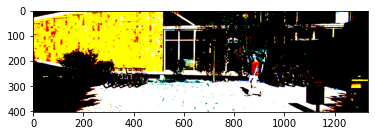

In [47]:
print(self_drive_assist(model,'./test_set/stop_1.png'))

`test_system()`를 통해서 10가지 입력에 대해 주행보조 시스템을 평가해봅니다.

In [ ]:
def test_system(func):
    work_dir = '/content/drive/MyDrive/Colab Notebooks/KITTI'
    score = 0
    test_set=[
        ("test_set/stop_1.png", "Stop"),
        ("test_set/stop_2.png", "Stop"),
        ("test_set/stop_3.png", "Stop"),
        ("test_set/stop_4.png", "Stop"),
        ("test_set/stop_5.png", "Stop"),
        ("test_set/go_1.png", "Go"),
        ("test_set/go_2.png", "Go"),
        ("test_set/go_3.png", "Go"),
        ("test_set/go_4.png", "Go"),
        ("test_set/go_5.png", "Go"),
    ]

    for image_file, answer in test_set:
        image_path = work_dir + '/' + image_file
        pred = self_drive_assist(model=model, img_path=image_path)
        print(image_file)
        print(f'prediction: {pred}, answer: {answer}\n')
        if pred == answer:
            score += 10
    print(f"결과: {score}점입니다.")

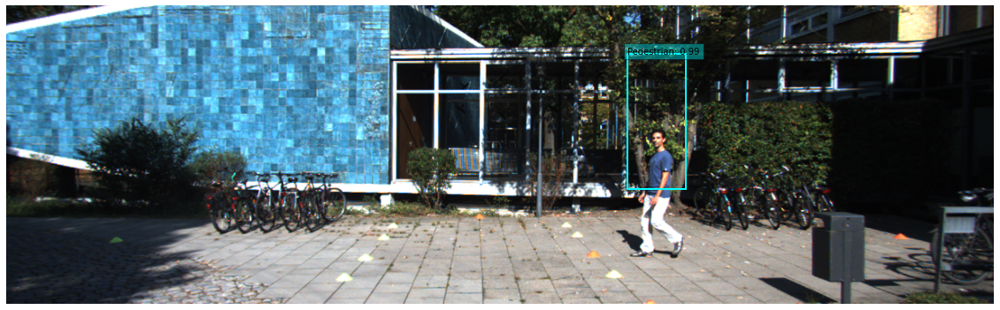

test_set/stop_1.png
prediction: Stop, answer: Stop



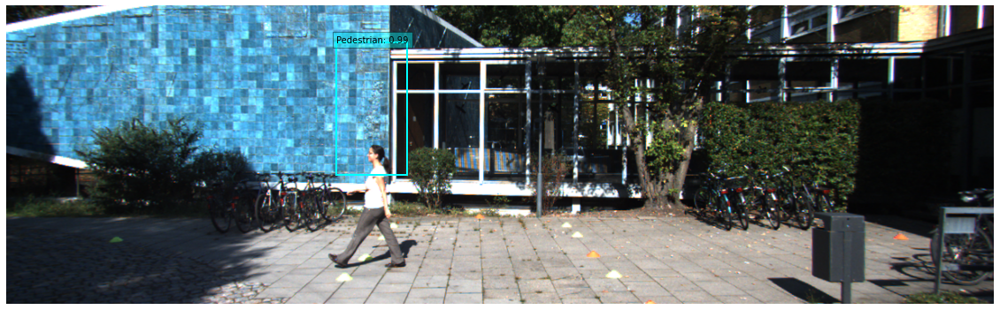

test_set/stop_2.png
prediction: Stop, answer: Stop



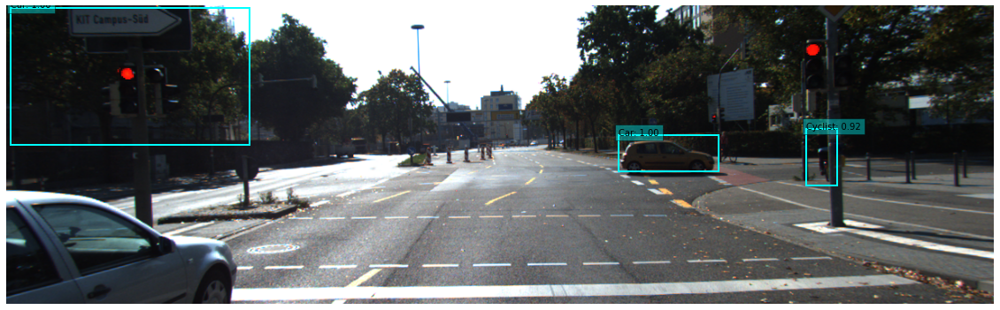

tf.Tensor(145.86508, shape=(), dtype=float32) tf.Tensor(54.066856, shape=(), dtype=float32) tf.Tensor(1.0890523, shape=(), dtype=float32)
tf.Tensor(351.14453, shape=(), dtype=float32) tf.Tensor(201.42792, shape=(), dtype=float32) tf.Tensor(1.0890523, shape=(), dtype=float32)
test_set/stop_3.png
prediction: Stop, answer: Stop



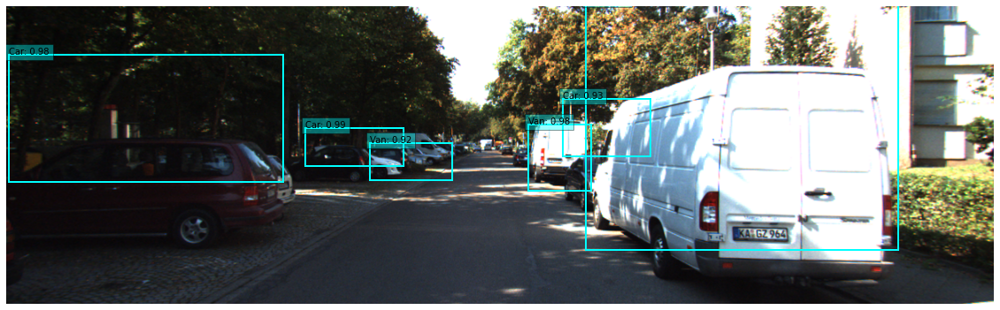

tf.Tensor(141.25098, shape=(), dtype=float32) tf.Tensor(55.365154, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(451.8023, shape=(), dtype=float32) tf.Tensor(359.84058, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
test_set/stop_4.png
prediction: Stop, answer: Stop



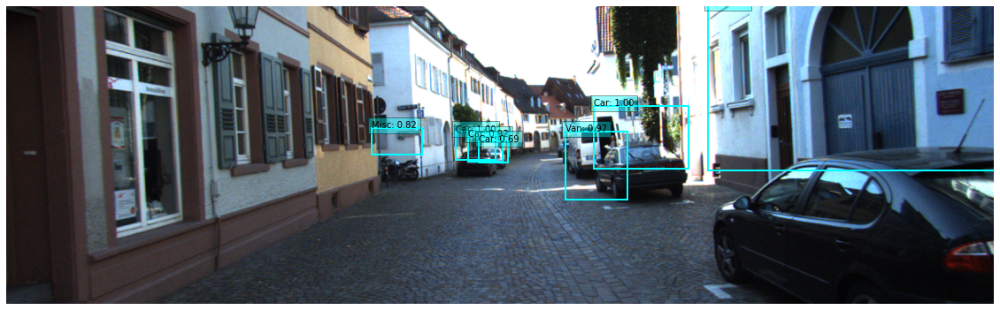

tf.Tensor(58.61015, shape=(), dtype=float32) tf.Tensor(40.103565, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(137.06215, shape=(), dtype=float32) tf.Tensor(90.82865, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(416.24307, shape=(), dtype=float32) tf.Tensor(239.3481, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
test_set/stop_5.png
prediction: Stop, answer: Stop



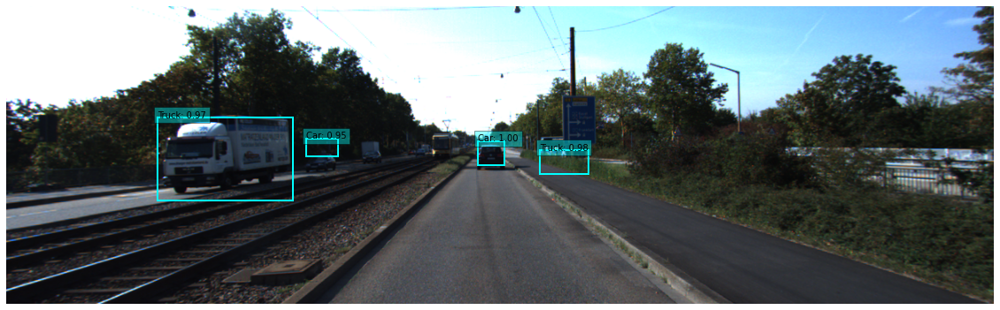

tf.Tensor(38.590252, shape=(), dtype=float32) tf.Tensor(35.00056, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(70.60765, shape=(), dtype=float32) tf.Tensor(34.359047, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(196.59276, shape=(), dtype=float32) tf.Tensor(120.59916, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(46.808517, shape=(), dtype=float32) tf.Tensor(26.338749, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
test_set/go_1.png
prediction: Go, answer: Go



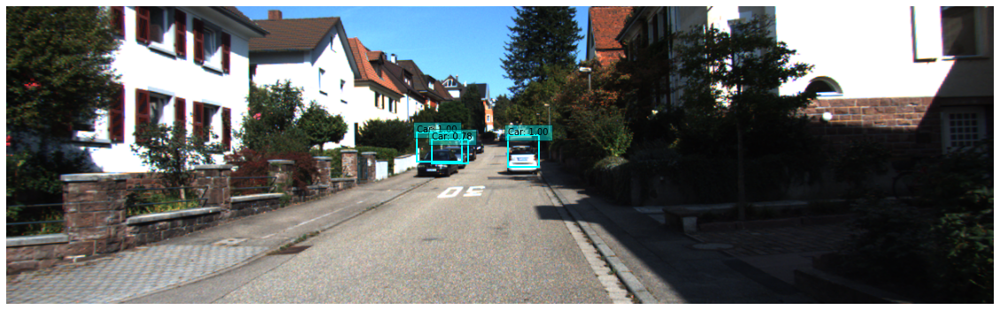

tf.Tensor(44.394184, shape=(), dtype=float32) tf.Tensor(46.08545, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(64.32473, shape=(), dtype=float32) tf.Tensor(42.051716, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(51.922264, shape=(), dtype=float32) tf.Tensor(34.926113, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
test_set/go_2.png
prediction: Go, answer: Go



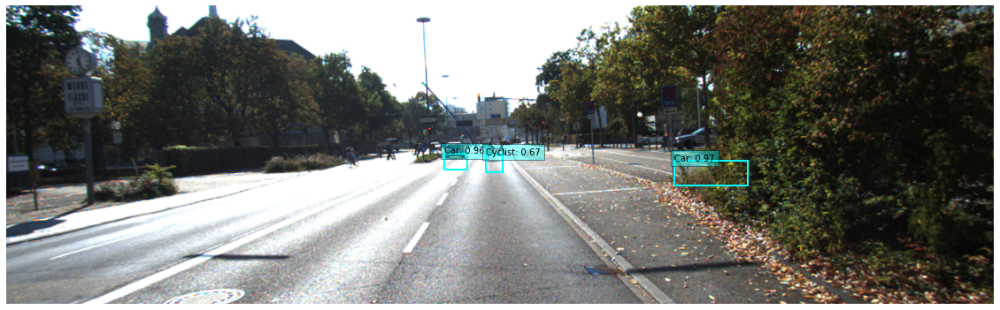

tf.Tensor(107.87361, shape=(), dtype=float32) tf.Tensor(35.94727, shape=(), dtype=float32) tf.Tensor(1.0890523, shape=(), dtype=float32)
tf.Tensor(32.986904, shape=(), dtype=float32) tf.Tensor(24.327032, shape=(), dtype=float32) tf.Tensor(1.0890523, shape=(), dtype=float32)
tf.Tensor(25.275665, shape=(), dtype=float32) tf.Tensor(25.788353, shape=(), dtype=float32) tf.Tensor(1.0890523, shape=(), dtype=float32)
test_set/go_3.png
prediction: Go, answer: Go



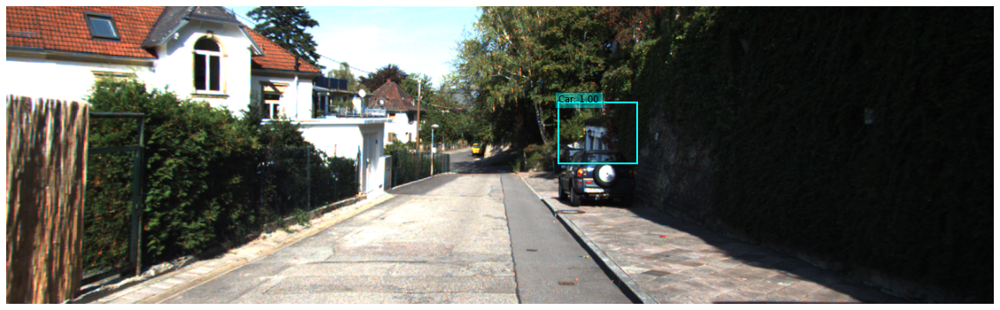

tf.Tensor(113.29852, shape=(), dtype=float32) tf.Tensor(88.992455, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
test_set/go_4.png
prediction: Go, answer: Go



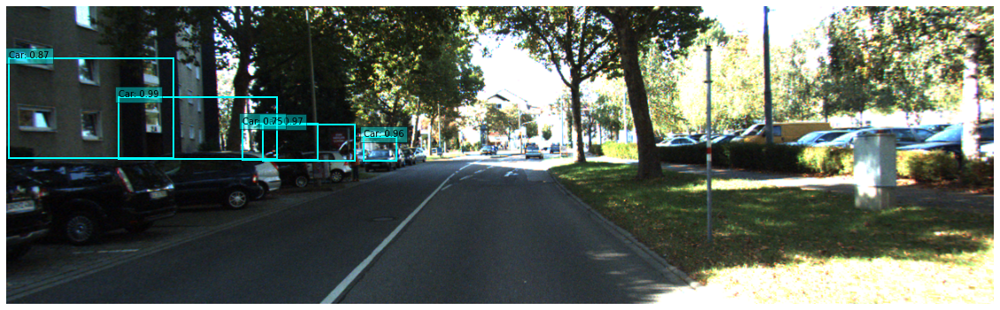

tf.Tensor(230.33673, shape=(), dtype=float32) tf.Tensor(90.134964, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(133.45232, shape=(), dtype=float32) tf.Tensor(52.8787, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(47.764496, shape=(), dtype=float32) tf.Tensor(34.359932, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(238.38623, shape=(), dtype=float32) tf.Tensor(144.61716, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
tf.Tensor(109.68043, shape=(), dtype=float32) tf.Tensor(52.02557, shape=(), dtype=float32) tf.Tensor(1.0732689, shape=(), dtype=float32)
test_set/go_5.png
prediction: Go, answer: Go

결과: 100점입니다.


In [ ]:
test_system(self_drive_assist)

___
## 회고
2차원 뿐만 아니라 3차원 정보까지 라벨링된 데이터셋인 KITTI 데이터셋을 직접 다뤄보았습니다. 트레이닝셋 데이터의 이미지 개수가 약 7500개 정도로도 적은것 같아보여도 우수한 성능을 보여줄 수 있다는 점이 흥미로웠습니다. retinanet을 공부하면서 Anchor box, FPN의 개념과 IoU의 활용법 등을 학습해보았습니다.